The main objective is to build a predictive model that can classify individuals into different credit score categories (e.g., Bad, Standard, Good) based on the available features. The use of XAI methods  can assist lenders in making informed decisions regarding credit approvals and risk management.

In [1]:
# Import libraries

import numpy as np
import pandas as pd
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    log_loss,
    roc_auc_score,
    confusion_matrix,
    classification_report)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import ClusterCentroids

from sklearn import svm
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

import shap
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.inspection import partial_dependence, PartialDependenceDisplay
from pdpbox import pdp, info_plots
import lime
import lime.lime_tabular
import anchor
from alibi.explainers import AnchorTabular

#from xgboost import XGBClassifier

In [2]:
# Import the data

dt = pd.read_csv("train_clean.csv")

Feature Engineering

In [3]:
# Drop columns that are not useful for the credit scoring problem. 
dt = dt.drop(['ID','Name','Month','SSN', 'Type_of_Loan'],axis=1)

# Calculate the ratio of outstanding debt to annual income
dt['Debt_to_Income_Ratio'] = dt['Outstanding_Debt'] / dt['Annual_Income']

Encoding 

In [4]:
# Select categorical columns
categorical_cols = dt.select_dtypes(include='object').columns

# Select numerical columns
numerical_cols = dt.select_dtypes(include=['int64', 'float64']).columns

print('Num of Numerical Columns: ', len(numerical_cols), 'and Num of Categorical Columns: ', len(categorical_cols))

Num of Numerical Columns:  18 and Num of Categorical Columns:  6


In [5]:
#   Ordinal Encoding for Payment_of_Min_Amount
pay_order = {'Yes':2, 'NM':1, 'No':0}
dt['Payment_of_Min_Amount'] = dt['Payment_of_Min_Amount'].map(pay_order)

#  Ordinal Encoding for Credit_Mix and Credit Score
mix_order = {'Bad': 0, 'Standard': 1, 'Good': 2}
dt['Credit_Mix'] = dt['Credit_Mix'].map(mix_order)

score_order =  {'Poor': 0, 'Standard': 1, 'Good': 2}
#dt['Credit_Score'] = dt['Credit_Score'].map(score_order)

#   Convert nominal variables
#dt = pd.get_dummies(dt, columns=['Occupation', 'Payment_Behaviour'], drop_first=True)

label_encoder = LabelEncoder()
dt['Occupation'] = label_encoder.fit_transform(dt['Occupation'])                
dt['Payment_Behaviour'] = label_encoder.fit_transform(dt['Payment_Behaviour'])

#  Encoding for target variable
#dt['Credit_Score'] = label_encoder.fit_transform(dt['Credit_Score'])

In [134]:
dt

,Customer_ID,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Debt_to_Income_Ratio
0,CUS_0xd40,23.0,12,19114.12,1824.843333,3,4,3,4,3,...,809.98,26.822620,265.0,0,49.574949,80.415,2,312.49408,Good,0.042376
1,CUS_0xd40,23.0,12,19114.12,1824.843333,3,4,3,4,-1,...,809.98,31.944960,266.0,0,49.574949,118.280,3,284.62915,Good,0.042376
2,CUS_0xd40,23.0,12,19114.12,1824.843333,3,4,3,4,3,...,809.98,28.609352,267.0,0,49.574949,81.700,4,331.20987,Good,0.042376
3,CUS_0xd40,23.0,12,19114.12,1824.843333,3,4,3,4,5,...,809.98,31.377862,268.0,0,49.574949,199.458,5,223.45131,Good,0.042376
4,CUS_0xd40,23.0,12,19114.12,1824.843333,3,4,3,4,6,...,809.98,24.797347,269.0,0,49.574949,41.420,1,341.48923,Good,0.042376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,25.0,9,39628.99,3359.415833,4,6,7,2,23,...,502.38,34.663572,378.0,0,35.104023,60.971,0,479.86624,Poor,0.012677
99996,CUS_0x942c,25.0,9,39628.99,3359.415833,4,6,7,2,18,...,502.38,40.565631,379.0,0,35.104023,54.186,1,496.65160,Poor,0.012677
99997,CUS_0x942c,25.0,9,39628.99,3359.415833,4,6,7,2,27,...,502.38,41.255522,380.0,0,35.104023,24.028,0,516.80910,Poor,0.012677
99998,CUS_0x942c,25.0,9,39628.99,3359.415833,4,6,7,2,20,...,502.38,33.638208,381.0,0,35.104023,251.673,3,319.16498,Standard,0.012677


In [6]:
# Group by customer id and aggregate dataset
                                        
                                        # features that don't take unique values for each customer.
grouped = dt.groupby('Customer_ID').agg({'Delay_from_due_date': 'mean', 'Changed_Credit_Limit': 'mean',
                                        'Num_Credit_Inquiries':'max', 'Outstanding_Debt':'mean',
                                        'Credit_Utilization_Ratio':'mean', 'Credit_History_Age':'max',
                                       'Amount_invested_monthly':'mean', 'Monthly_Balance':'mean',
                                        'Payment_of_Min_Amount':'mean', 'Payment_Behaviour':'last', 'Debt_to_Income_Ratio':'mean',

                                        # features with a single value per customer.
                                       'Occupation':'first', 'Annual_Income':'first', 'Monthly_Inhand_Salary':'mean',
                                       'Num_Bank_Accounts':'first', 'Num_Credit_Card':'first' , 'Age':'first',
                                        'Interest_Rate':'first', 'Num_of_Loan':'first', 'Num_of_Delayed_Payment':'first',
                                        'Credit_Mix':'first', 'Total_EMI_per_month':'first',
                                         'Credit_Score':'first'}).reset_index()                                         

grouped

,Customer_ID,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Amount_invested_monthly,Monthly_Balance,Payment_of_Min_Amount,...,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Age,Interest_Rate,Num_of_Loan,Num_of_Delayed_Payment,Credit_Mix,Total_EMI_per_month,Credit_Score
0,CUS_0x1000,62.250,1.880,11.0,1562.91,33.477546,129.0,158.549750,335.375339,2.000,...,2706.161667,6,5,17.0,27,2,25.0,0,42.941090,Standard
1,CUS_0x1009,7.250,9.730,4.0,202.68,29.839984,372.0,146.679375,428.743153,1.875,...,4250.390000,6,5,26.0,17,4,18.0,1,108.366467,Standard
2,CUS_0x100b,13.500,10.965,4.0,1030.20,34.841449,190.0,1711.742875,781.229780,0.125,...,9549.782500,1,4,18.0,1,0,7.0,2,0.000000,Poor
3,CUS_0x1011,27.250,14.170,7.0,473.14,27.655897,190.0,1522.178250,332.642843,1.875,...,5208.872500,3,3,44.0,17,3,15.0,1,123.434939,Standard
4,CUS_0x1013,12.500,1.705,3.0,1233.51,31.933940,214.0,355.442500,472.781003,0.125,...,7962.415000,3,3,44.0,6,3,9.0,2,228.018084,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,CUS_0xff3,12.250,8.485,5.0,1229.08,32.889398,208.0,83.918625,271.671559,0.000,...,1176.398750,0,6,55.0,2,3,9.0,2,33.299764,Good
12496,CUS_0xff4,15.875,8.205,5.0,758.44,32.598257,225.0,152.775750,259.981171,1.875,...,2415.855000,8,7,37.0,14,5,13.0,1,101.328637,Standard
12497,CUS_0xff6,-0.125,11.900,2.0,338.30,33.258053,299.0,1785.239250,603.570680,0.000,...,9727.326667,5,6,19.0,1,2,4.0,2,126.638453,Standard
12498,CUS_0xffc,45.375,9.320,13.0,1300.13,34.722108,158.0,1386.651375,339.951776,2.000,...,5218.097500,6,8,17.0,27,8,16.0,0,272.809169,Poor


Standarization

In [7]:
# All numerical features are standardized to have zero mean and unit standard deviation since each feature has a different range of values.

def standar(data):
    
    scaler = StandardScaler() 
    data = scaler.fit_transform(data) 
    
    return(data)

In [9]:
# Standarize only numerical columns in both original data and grouped data

#dt[numerical_cols] = standar(dt[numerical_cols])
#grouped[numerical_cols] = standar(grouped[numerical_cols])

Feature Selection

Correlation-based Feature Selection

Correlation-based Feature Selection (CFS) is a feature selection technique that selects subsets of features that are highly correlated with the target variable but have low correlation with each other. For classification problems, the correlation is calculated using the Symmetrical Uncertainty measure, which takes into account the mutual information between the features and the target variable.

In [14]:
def CFS(data,k):

# calculate the correlation matrix between the features and the target variable

    corr_matrix = data.corr()
    corr_with_target = corr_matrix['Credit_Score']


# sort the correlation values in descending order and select the top k features

    top_k = corr_with_target.abs().sort_values(ascending=False)[:k].index
    selected_features = data[top_k]
    
    return(selected_features)

In [27]:
selected_features = CFS(grouped.drop(columns=['Customer_ID']),21)

# Correlation matrix of the selected features
selected_features.corr()

,Credit_Score,Credit_Mix,Interest_Rate,Payment_of_Min_Amount,Delay_from_due_date,Num_Credit_Inquiries,Num_Credit_Card,Num_Bank_Accounts,Num_of_Delayed_Payment,Credit_History_Age,...,Num_of_Loan,Debt_to_Income_Ratio,Monthly_Balance,Annual_Income,Monthly_Inhand_Salary,Changed_Credit_Limit,Age,Credit_Utilization_Ratio,Payment_Behaviour,Amount_invested_monthly
Credit_Score,1.000000,0.562313,-0.549824,-0.498711,-0.487838,-0.480751,-0.457510,-0.434528,-0.430095,0.429479,...,-0.396059,-0.335775,0.305708,0.239816,0.238773,-0.195980,0.182185,0.141778,-0.080396,0.038257
Credit_Mix,0.562313,1.000000,-0.753124,-0.763017,-0.693651,-0.643780,-0.544857,-0.723724,-0.770307,0.641943,...,-0.637558,-0.532085,0.461173,0.342239,0.341103,-0.444250,0.243137,0.224019,-0.110855,0.061207
Interest_Rate,-0.549824,-0.753124,1.000000,0.628057,0.592583,0.614688,0.497870,0.584301,0.581304,-0.576378,...,0.559156,0.489282,-0.401586,-0.302352,-0.301943,0.380473,-0.217856,-0.187988,0.102399,-0.050805
Payment_of_Min_Amount,-0.498711,-0.763017,0.628057,1.000000,0.507530,0.607914,0.412151,0.579256,0.599460,-0.586249,...,0.514193,0.389799,-0.408812,-0.306544,-0.305880,0.521761,-0.266427,-0.204766,0.098739,-0.053625
Delay_from_due_date,-0.487838,-0.693651,0.592583,0.507530,1.000000,0.530078,0.482193,0.563396,0.554847,-0.494234,...,0.504218,0.435589,-0.345596,-0.251647,-0.251063,0.306056,-0.175370,-0.158999,0.082122,-0.033990
Num_Credit_Inquiries,-0.480751,-0.643780,0.614688,0.607914,0.530078,1.000000,0.445971,0.502795,0.495384,-0.595857,...,0.551901,0.450114,-0.383624,-0.273969,-0.273242,0.380130,-0.242382,-0.191498,0.099020,-0.050247
Num_Credit_Card,-0.457510,-0.544857,0.497870,0.412151,0.482193,0.445971,1.000000,0.442226,0.430603,-0.417104,...,0.417827,0.376465,-0.290901,-0.217850,-0.216964,0.262345,-0.148524,-0.137453,0.072979,-0.035002
Num_Bank_Accounts,-0.434528,-0.723724,0.584301,0.579256,0.563396,0.502795,0.442226,1.000000,0.612245,-0.485343,...,0.472414,0.402867,-0.366733,-0.284117,-0.283371,0.343248,-0.190775,-0.178418,0.094407,-0.055346
Num_of_Delayed_Payment,-0.430095,-0.770307,0.581304,0.599460,0.554847,0.495384,0.430603,0.612245,1.000000,-0.490402,...,0.481787,0.397129,-0.378843,-0.290790,-0.289897,0.343818,-0.187591,-0.188473,0.085135,-0.068692
Credit_History_Age,0.429479,0.641943,-0.576378,-0.586249,-0.494234,-0.595857,-0.417104,-0.485343,-0.490402,1.000000,...,-0.605885,-0.483569,0.398099,0.272449,0.271663,-0.440924,0.234391,0.181777,-0.099858,0.052064


 All the attributes are correlated with each other and also the vast majority of them are correlated with the target variable.
More precisly:
- Interest Rate has high positive correlation with payment of min amount, which means that customers with higher interest rates are more likely to pay the min amount.
- As the outstandidng debt increases, customers are more likely to be delayed in the payment.
- People with high credit history age, have lower interest rates.
- The more the credit cards owned by a customer, the more the outstanding debt.
- The more the numner of bank accounts the more the interest rate and the delays and the least the credit score.
- Payment behaviour and amount invested monthly does not affect credit score.

PCA 
Principal Component Analysis is a dimensionality reduction technique used to simplify datasets while retaining as much variance as possible. It transforms the data into a new coordinate system where the greatest variance lies along the first axis (principal component), the second greatest variance along the second axis, and so on.

In [29]:
# Perform PCA on non-scaled variables
pca = PCA()
pca.fit(grouped[numerical_cols])

# Get the explained variance ratio for each principal component
explained_variance_ratio = pca.explained_variance_ratio_
explained_variance_ratio

array([9.98732966e-01, 8.40270961e-04, 3.86946535e-04, 2.35101014e-05,
       9.79074140e-06, 3.76121326e-06, 2.50723031e-06, 1.00446897e-07,
       7.29869160e-08, 2.64756446e-08, 2.08543456e-08, 1.35093514e-08,
       5.23683159e-09, 2.28319390e-09, 2.12014363e-09, 1.83701291e-09,
       1.28698753e-09, 1.79161018e-12])

In [60]:
# Fit PCA with 16 principal components based on the cumulative variance ratio

num_vars_scaled = standar(grouped[numerical_cols])

pca = PCA(n_components=16)
pc_scores = pca.fit_transform(num_vars_scaled)

# Get the eigenvalues and eigenvectors
eigenvalues = pca.explained_variance_
eigenvectors = pca.components_

# Create a dictionary to store the loadings
loadings = {}

for i, pc in enumerate(eigenvectors):
    loading_list = []
    for j, var in enumerate(numerical_cols):
        loading = pc[j]
        loading_list.append((var, loading))
        

    loading_list.sort(key=lambda x: abs(x[1]), reverse=True)
   
    loadings[f'PC{i+1}'] = loading_list

# Print out the loadings
for pc, loading_list in loadings.items():
    print(f'Principal Component {pc}:')
    for var, loading in loading_list:
        print(f'\t{var}: {loading:.3f}')
    print('\n')

Principal Component PC1:
	Outstanding_Debt: 0.300
	Interest_Rate: 0.294
	Num_of_Loan: 0.281
	Credit_History_Age: -0.280
	Num_Credit_Inquiries: 0.277
	Debt_to_Income_Ratio: 0.270
	Delay_from_due_date: 0.268
	Monthly_Balance: -0.268
	Num_of_Delayed_Payment: 0.267
	Num_Bank_Accounts: 0.266
	Num_Credit_Card: 0.230
	Annual_Income: -0.227
	Monthly_Inhand_Salary: -0.227
	Changed_Credit_Limit: 0.200
	Credit_Utilization_Ratio: -0.146
	Age: -0.110
	Amount_invested_monthly: -0.043
	Total_EMI_per_month: 0.004


Principal Component PC2:
	Annual_Income: 0.478
	Monthly_Inhand_Salary: 0.477
	Total_EMI_per_month: 0.417
	Monthly_Balance: 0.330
	Credit_Utilization_Ratio: 0.244
	Num_of_Loan: 0.158
	Outstanding_Debt: 0.155
	Delay_from_due_date: 0.145
	Credit_History_Age: -0.142
	Num_Credit_Inquiries: 0.136
	Interest_Rate: 0.133
	Num_Credit_Card: 0.122
	Amount_invested_monthly: 0.117
	Num_Bank_Accounts: 0.111
	Changed_Credit_Limit: 0.111
	Num_of_Delayed_Payment: 0.105
	Age: -0.078
	Debt_to_Income_Ratio: -0.

Since each principal component is a linear combination of the original features, PCA Loadings indicate how much each original attribute contributes to a given principal component. By examining these loadings, we can determine which attributes are most influential in defining the directions of maximum variance. These are outstanding debt, annual income, interest rate, etc. We observe that every attribute is important for the analysis. 

In [61]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
print("Cumulative Explained Variance:", cumsum)


Cumulative Explained Variance: [0.38993969 0.53331563 0.59361344 0.64733727 0.69901705 0.7478027
 0.78655294 0.82105786 0.85285854 0.88194318 0.90611851 0.92801968
 0.94945866 0.96921281 0.98418681 0.99600492]


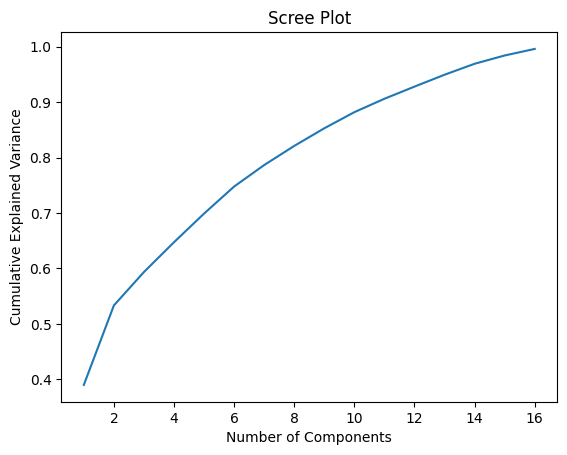

In [62]:
#  Scree Plot
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()


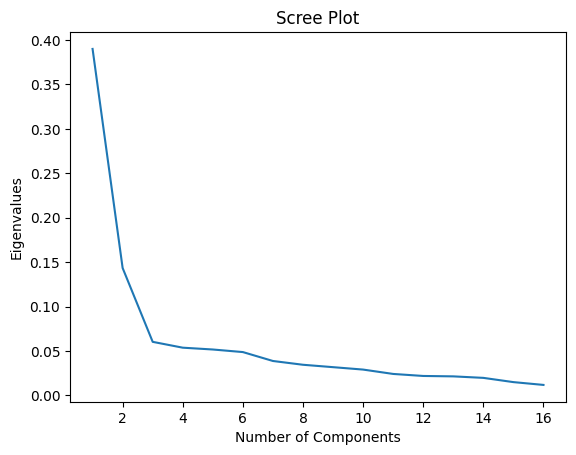

In [66]:
#  Scree Plot
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.xlabel('Number of Components')
plt.ylabel('Eigenvalues')
plt.title('Scree Plot')
plt.show()

The Scree Plot helps visualize how much variance is explained by each component. The scree plot criterion looks for the “elbow” in the curve and selects all components just before the line flattens out. Here, the elbow point occurs when k=2, where the Cumulative Explained Variance is only 53%.  it suggests that the dimensionality reduction achieved by PCA may result in a significant loss of information. Ideally, PCA should retain at least 85-90% of the variance, so the dataset may not be well-suited for PCA.

Evaluation Metrics 

In [8]:
def score(y_true, y_pred):

    # Accuracy
    acc = accuracy_score(y_true, y_pred)* 100
    
    # Precision, Recall, F1-Score (weighted)
    precision, recall, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average='weighted'
    )
    precision = precision * 100
    recall = recall * 100
    f1 = f1 * 100

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Type II Errors (Predicted as "Good" but actually "Bad" or "Standard")
    labels = np.unique(y_true)
    good_index = np.where(labels == 'Good')[0][0]
    type_ii_error = cm[:, good_index].sum() - cm[good_index, good_index]

    total_predictions = len(y_true)
    type_ii_error_percentage = (type_ii_error / total_predictions) * 100

    
    # Confusion Matrix Plot
    plt.figure(figsize=(4,2))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()
    
    return {
        "Accuracy (%)": f"{acc:.2f}",
        "Precision (Weighted, %)": f"{precision:.2f}",
        "Recall (Weighted, %)": f"{recall:.2f}",
        "F1-Score (Weighted, %)": f"{f1:.2f}",
        "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": type_ii_error,
        "Type II Error Percentage": f"{type_ii_error_percentage:.2f}"
    }

The type II error is more costly in credit scoring, since Type II (False Negative ratio) predicts a borrower as a good borrower but in actual
fact he or she is a bad borrower.

Data Balancing 

Undersampling for Data Balancing.

Undersampling is a technique used to address class imbalance in a dataset by reducing the number of samples in the majority class so that it is balanced with the minority class. This can help machine learning models perform better when the dataset is skewed towards one class.

Cluster Centroids replace the majority class with centroids of clusters formed within the majority class.

In [9]:
X = grouped.drop(columns=['Credit_Score','Customer_ID'])  # undersampling should be done before standardization
y = grouped['Credit_Score']
cc = ClusterCentroids(random_state=42)
X_res, y_res = cc.fit_resample(X, y)

In [72]:
y_res.value_counts()

Credit_Score
0    1975
1    1975
2    1975
Name: count, dtype: int64

In [73]:
y.value_counts()

Credit_Score
1    6943
0    3582
2    1975
Name: count, dtype: int64

Model implementation and evaluation

In [10]:
dt = DecisionTreeClassifier(random_state=0,max_depth=15)
rfc = RandomForestClassifier(random_state=2)
log_reg = LogisticRegression(multi_class='multinomial',random_state=4)
svm = SVC(kernel='rbf', decision_function_shape='ovr',probability=True)
knn = KNeighborsClassifier(n_neighbors=21)
nb = GaussianNB()

# Standarize the numerical columns and split the undersampled data
X_res[numerical_cols] = standar(X_res[numerical_cols])
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state = 50, stratify=y_res)
    
def fit_predict_evaluate_model(model):
    
    model.fit(X_train,y_train)
    predictions = model.predict(X_test)
    return (score(y_test, predictions))
   

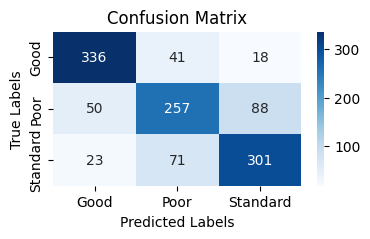

{'Accuracy (%)': '75.44',
 'Precision (Weighted, %)': '75.25',
 'Recall (Weighted, %)': '75.44',
 'F1-Score (Weighted, %)': '75.31',
 "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 73,
 'Type II Error Percentage': '6.16'}

In [11]:
# Decision Tree Classifier 
model = dt
fit_predict_evaluate_model(model)

In [27]:
# Number of leaves in the model
model.get_n_leaves()

472

SHAP
It is the most widely used method in Explainable AI, due to the flexibility it provides. It comes with the advantage of providing both local and global level explanations, making our work easier. SHAP is short for Shapley Additive Explanations.

In [12]:
#  Create SHAP Explainer
explainer = shap.Explainer(model,output_names=['Good', 'Poor', 'Standard'],algorithm = 'tree')

#  Compute SHAP Values for Test Data
shap_values = explainer.shap_values(X_test)

Summary plot for Class: Good


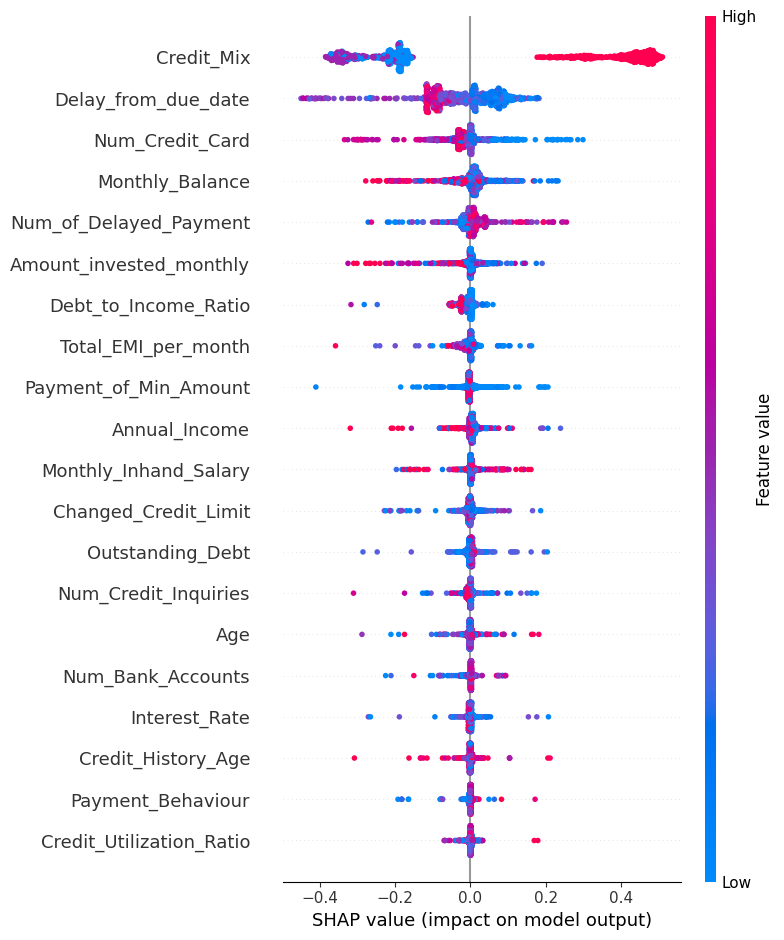

Summary plot for Class: Poor


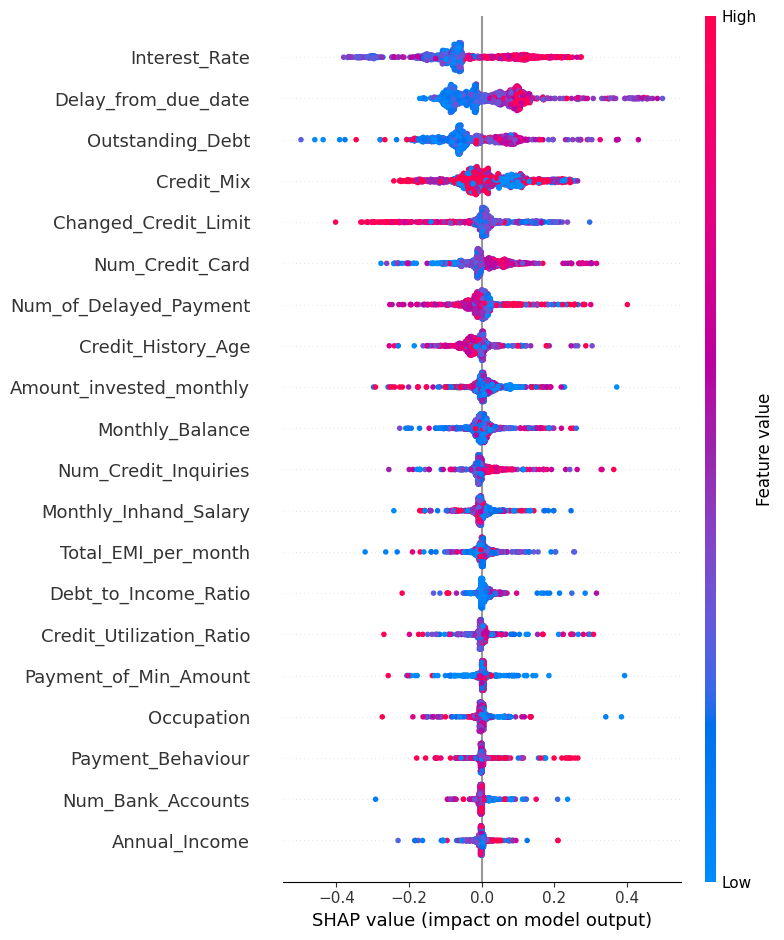

Summary plot for Class: Standard


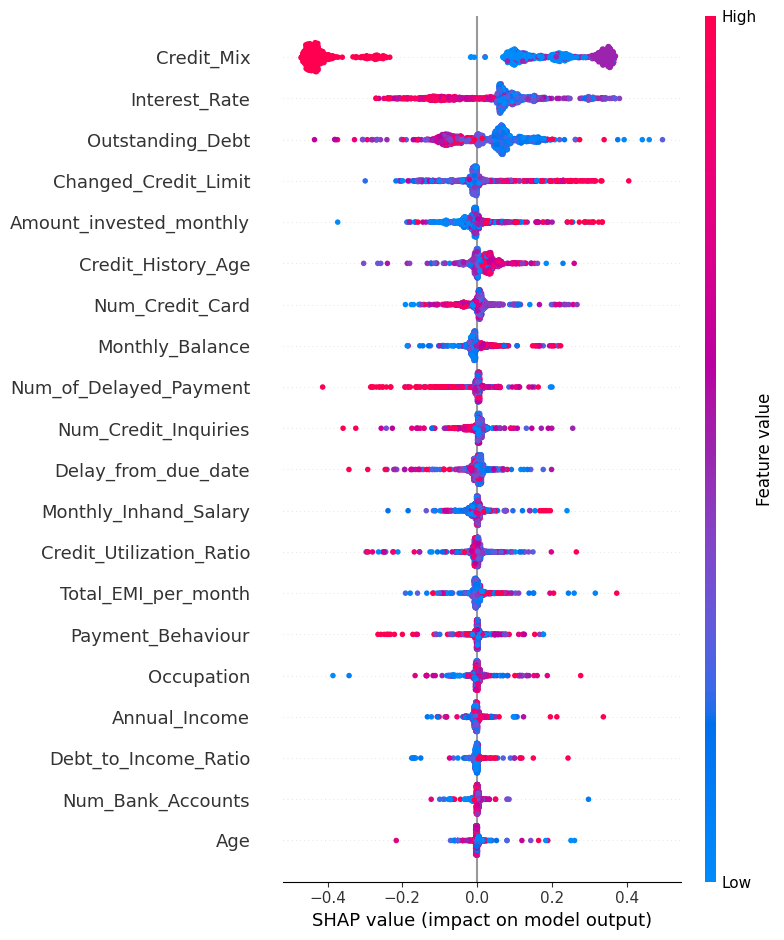

In [13]:
#  Create SHAP Explainer
explainer = shap.Explainer(model,output_names=['Good', 'Poor', 'Standard'],algorithm = 'tree')

#  Compute SHAP Values for Test Data
shap_values = explainer.shap_values(X_test)

# Visualize SHAP Values for Each Class
# Summary plot for Class 0
print( 'Summary plot for Class: Good')
shap.summary_plot(shap_values = shap_values[:,:,0],features = X_test, feature_names=X_test.columns)

# Summary plot for Class 1
print( 'Summary plot for Class: Poor')
shap.summary_plot(shap_values[:,:,1], X_test, feature_names=X_test.columns)

# Summary plot for Class 2
print( 'Summary plot for Class: Standard')
shap.summary_plot(shap_values[:,:,2], X_test, feature_names=X_test.columns)


The summary plot for multiclass classification can show you what the machine managed to learn from the features. This visualization helps us understand which features drive the model's decisions and how their values influence predictions. Y-Axis lists the features in descending order of their importance, and X-Axis represents the SHAP value (impact on the model's output). The further a feature's SHAP values deviate from zero, the more influential that feature is. Each dot represents a single prediction instance. The position of the dot on the X-axis shows the impact of that feature on the prediction for that instance and color indicates the feature value. 

Good Credit Score:
The most influencial attributes are credit mix, delay from due date and number of credit cards. People with less credit cards and less delays are more likely to be classified as 'Good'. 

Poor Credit Score:
Primary Drivers of a "Poor" credit score are High Interest Rate, Significant Delay_from_due_date, High Outstanding Debt, Poor Credit Mix and a high Number of Delayed Payments.

Standard Credit Score:
The most influential feature for this class is "Credit_Mix", followed by "Interest_Rate", "Outstanding_Debt", etc. Customers with lower interest rates are more likely to be classified as "Standard." High outstanding debt (pink) tends to have a negative impact, whereas low outstanding debt (blue) has a positive impact on the classification. Features like "Num_of_Delayed_Payment" and "Delay from due date" have clear patterns where higher values tend to negatively impact the model’s prediction, indicating that more delays and higher utilization are bad for being classified as "Standard."


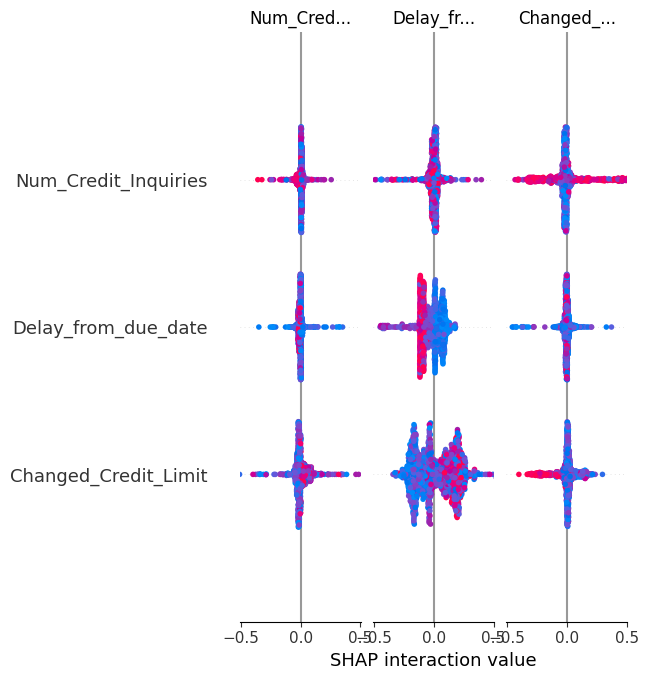

In [28]:
class_names = ['Good', 'Poor', 'Standard']
shap.summary_plot(shap_values, X_test.values, plot_type='bar', class_names=class_names, feature_names = X_test.columns)

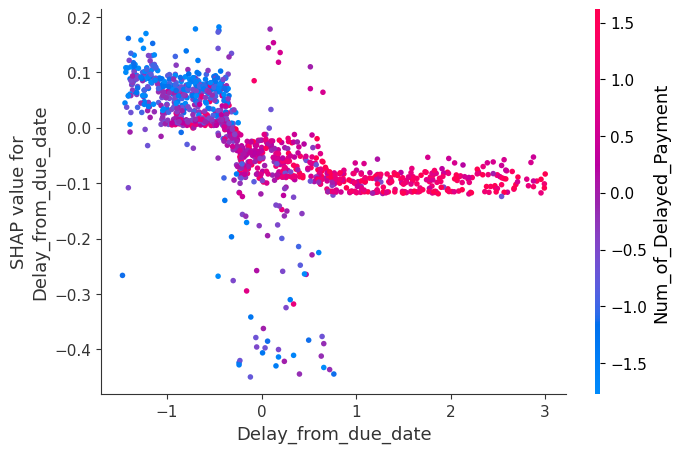

In [40]:
# Dependence plot for Delay_from_due_date, Class 'Good'

shap.dependence_plot(0,shap_values[:,:,0],X_test.values, feature_names = X_test.columns)

In this dependence plot for delay from due date, the points are colored by the number of delayed payments. Customers with good credit score have high shap values for the variable delay from due date. Also, customers with many delayed payments in total, tend to delay more days their payments.

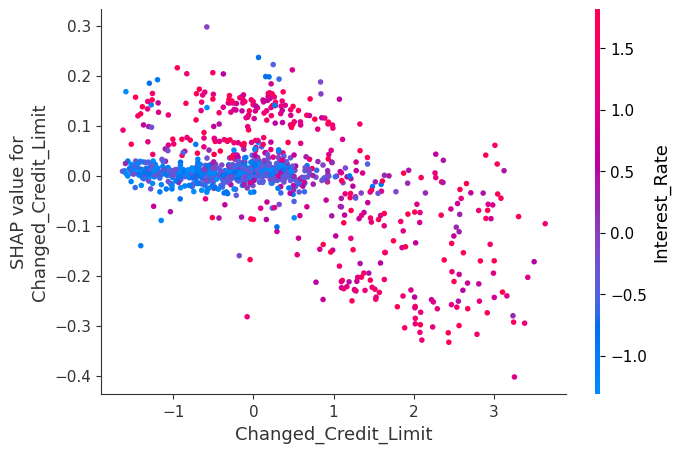

In [42]:
# Dependence plot for class 1 (Poor)
shap.dependence_plot(1,shap_values[:,:,1],X_test.values, feature_names = X_test.columns)

People with low interest rates that are classified as 'Poor' have shap value close to 0 for the attribute changed_credit_limit.

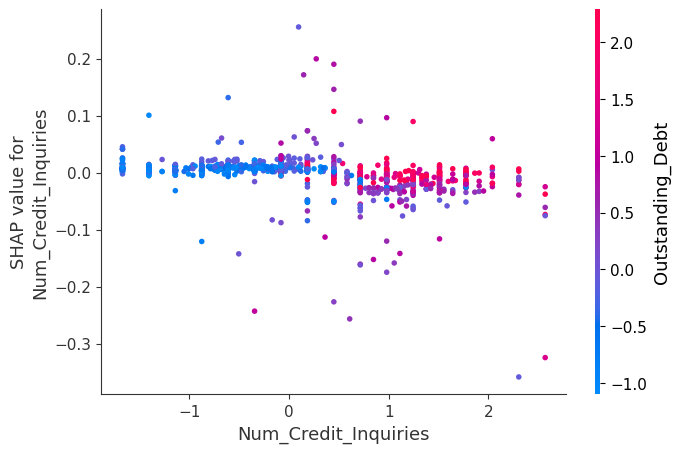

In [41]:
# Dependence plot for Class 2 (Standard)

shap.dependence_plot(2,shap_values[:,:,2],X_test.values, feature_names = X_test.columns)

For customers that are classified as Standard, the more the outstanding debt, the more the number of credit inquiries, while the shap value for number of credit inquiries remains mostly close to 0.

In [32]:
# Shap values for individual predictions 

y_pred = pd.Series(model.predict(X_test.iloc[0:11]),name='prediction')
y_true = pd.Series(y_test.iloc[0:11].values, name = 'true score')
pd.DataFrame([y_true,y_pred])
# Data to experiment with: 

,0,1,2,3,4,5,6,7,8,9,10
true score,Standard,Poor,Standard,Poor,Standard,Poor,Standard,Good,Standard,Standard,Standard
prediction,Poor,Poor,Poor,Standard,Standard,Poor,Standard,Good,Standard,Standard,Poor


In [14]:
#  Base values for each class
print(explainer.expected_value)

[0.33333333 0.33333333 0.33333333]


Here, the base value 0.3333 is the average prediction of the model and stays the same for all customers. The contribution from each feature is shown in the deviation of the final output value from the base value. Blue represents negative influence, and pink represents positive influence.

In [37]:
# SHAP values of an individual prediction in test dataset.
# Force plot for instance 1, where both the prediction and true label is 'Poor'.
shap.initjs()
i = 1
target = 1
shap.force_plot(explainer.expected_value[target], shap_values[:,:,target][i], X_test.values[i], feature_names=X_test.columns)

Using the above plot we can explain the customer why he was rejected for the loan. Credit history age and has very negative impact on the decision, while the number of delayed payments and the outstanding debt affect positively the decision.

In [46]:
# Force plot for instance 7, where both the prediction and true label is 'Good'.
shap.initjs()
i = 7
target = 0
shap.force_plot(explainer.expected_value[target], shap_values[:,:,target][i], X_test.values[i], feature_names=X_test.columns)

Waterfall Plot 

A waterfall plot provides a detailed breakdown of how each input variable contributes to the predicted credit score for a single customer. Input variables are ranked from top to bottom by how much impact they have on the models prediction for this example of the data. Shap values quantify the amount and direction in which each variable impacts the outcome. 

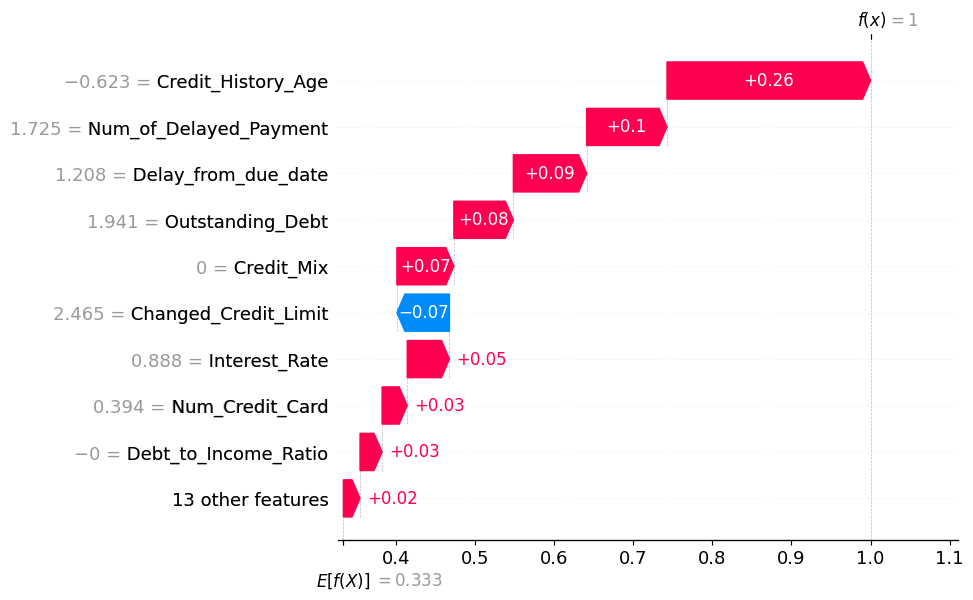

In [13]:
# Waterfall plot
row = 1
shap.waterfall_plot(shap.Explanation(values=shap_values[:,:,1][row], base_values=explainer.expected_value[1], 
                                     data=X_test.iloc[row], feature_names= X_test.columns.tolist()))

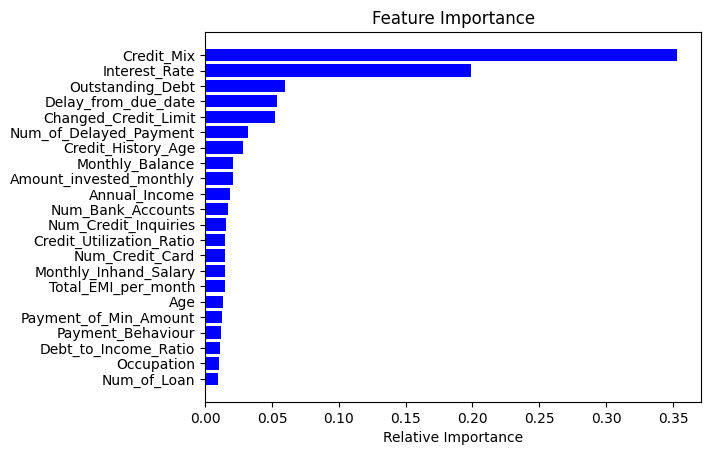

In [169]:
# Feature Importance 

def feature_importance(model):

    importances = model.feature_importances_
    indices = np.argsort(importances)
    features = X.columns
    plt.title('Feature Importance')
    plt.barh(range(len(indices)), importances[indices], color='b', align='center')

    plt.yticks(range(len(indices)),[features[i] for i in indices])
    plt.xlabel('Relative Importance')
    plt.show()
feature_importance(model)

Permutation Importance:

This is a method from the eli5 library used to calculate the importance of each feature by permuting (randomly shuffling) its values.
It measures how much the model's performance decreases when a feature's values are randomly shuffled, indicating how important that feature is for predictions. Features with higher weights such as credit mix, delay from due date, interest rate and outstanding debt contribute significantly to the model’s performance. 

The results are in accordance with the ones of the feature importance plot above.

In [170]:
# Permutation Importance

my_set = PermutationImportance(model, random_state=34).fit(X_test,y_test)
eli5.show_weights(my_set, feature_names = X_test.columns.tolist())

Weight,Feature
0.3548 ± 0.0223,Credit_Mix
0.0992 ± 0.0180,Delay_from_due_date
0.0802 ± 0.0070,Interest_Rate
0.0528 ± 0.0104,Outstanding_Debt
0.0412 ± 0.0117,Credit_History_Age
0.0316 ± 0.0097,Changed_Credit_Limit
0.0289 ± 0.0079,Num_Bank_Accounts
0.0267 ± 0.0115,Num_of_Delayed_Payment
0.0235 ± 0.0065,Debt_to_Income_Ratio
0.0208 ± 0.0065,Num_of_Loan


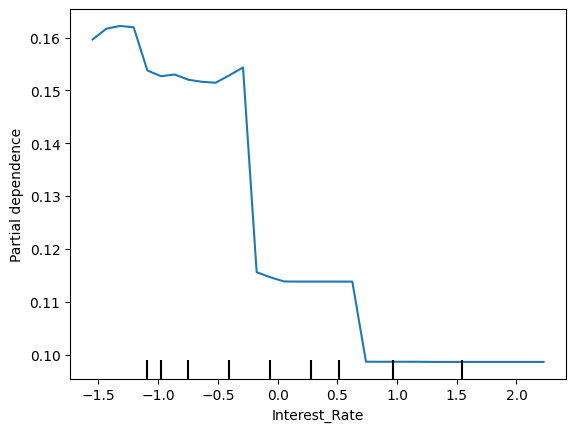

In [108]:
# Plot partial dependence for feature 'Interest Rate'

PartialDependenceDisplay.from_estimator(model, X_test, features='Interest_Rate',target='Good')
plt.show()


A Partial Dependence Plot (PDP) for Interest Rate shows the marginal effect that the Interest Rate feature has on the predictions of the model, while averaging out the influence of all other features. So, the downward trend suggests that higher interest rates are associated with lower predicted values (e.g., Higher probability of being a good credit risk).

These plots are useful both to extract insights, as well as to sanity check that our model is learning something we think is sensible.

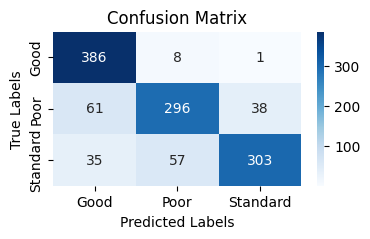

{'Accuracy (%)': '83.12',
 'Precision (Weighted, %)': '83.56',
 'Recall (Weighted, %)': '83.12',
 'F1-Score (Weighted, %)': '82.85',
 "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 96,
 'Type II Error Percentage': '8.10'}

In [49]:
# Random Forest Classifier Train and Evaluate 

rfc = RandomForestClassifier(random_state=2) # without Hyperparameter Tuning
model = rfc
fit_predict_evaluate_model(model)

In [40]:
# Hyperparameter Tuning for Random Forest Classifier.

from sklearn.model_selection import RandomizedSearchCV
import numpy as np
from sklearn.ensemble import RandomForestRegressor

y_train = label_encoder.fit_transform(y_train)
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
rf = RandomForestRegressor()

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                               n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

rf_random.fit(X_train, y_train)
rf_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'n_estimators': 1600,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 10,
 'bootstrap': True}

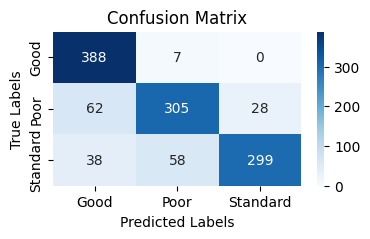

{'Accuracy (%)': '83.71',
 'Precision (Weighted, %)': '84.46',
 'Recall (Weighted, %)': '83.71',
 'F1-Score (Weighted, %)': '83.48',
 "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 100,
 'Type II Error Percentage': '8.44'}

In [14]:
# with Hyperparameter Tuning 
rfc_tuned = RandomForestClassifier(n_estimators= 1600,
 min_samples_split= 5,
 min_samples_leaf= 1,
 max_features= 'auto',
 max_depth= 10,
 bootstrap= True, 
 random_state=2)

model = rfc_tuned
fit_predict_evaluate_model(model)

In [53]:
y_pred = pd.Series(model.predict(X_test.iloc[0:11]),name='prediction')
y_true = pd.Series(y_test.iloc[0:11].values, name = 'true score')
pd.DataFrame([y_true,y_pred])
# Data to experiment with: 

,0,1,2,3,4,5,6,7,8,9,10
true score,Standard,Poor,Standard,Poor,Standard,Poor,Standard,Good,Standard,Standard,Standard
prediction,Poor,Poor,Standard,Poor,Standard,Poor,Standard,Good,Standard,Good,Poor


In [19]:
# eli5.show_prediction() displays how each feature contributed to the prediction for a given instance.

# Instance 7 from the example table.
class_names=['Good', 'Poor', 'Standard']
eli5.show_prediction(model, X_test.iloc[7], feature_names=list(X_test.columns), target_names=class_names)

In [25]:

# LIME explains individual predictions by approximating the model locally with an interpretable, simpler model (e.g., a linear model).
# It helps understand how the model behaves for a specific instance.

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['Good', 'Poor', 'Standard'],
                                                   mode='classification')

# Explain instance 0 prediction
exp = explainer.explain_instance(X_test.iloc[0].values, model.predict_proba)

# Show explanation
exp.show_in_notebook()

In [15]:

# LIME explains individual predictions by approximating the model locally with an interpretable, simpler model (e.g., a linear model).
# It helps understand how the model behaves for a specific instance.

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['Good', 'Poor', 'Standard'],
                                                   mode='classification')

# Explain instance 1 prediction
exp = explainer.explain_instance(X_test.iloc[1].values, model.predict_proba)

# Show explanation
exp.show_in_notebook()

In [67]:
# # Instance 1 from the example table.

eli5.show_prediction(model, X_test.iloc[1], feature_names=list(X_test.columns), target_names=class_names)

From the above 2 eli5 visualizations we observe that our model failed to predict correctly instance 0, and also with high difference in probability. While it predicted correctly instance 1, but with small difference in probability from class 'Standard'. 

In [26]:
# Explain instance 7 prediction using Lime explainer

exp = explainer.explain_instance(X_test.iloc[7].values, model.predict_proba)

# Show explanation
exp.show_in_notebook()

Test Customer No.7 was correctly predicted as Good credit risk by the model. Most important feature for the prediction was low number of delay from due date, followed by low outstanding debt, then low interest rate, debt to income ratio etc and also high credit history age.

A customer is more likely to be classified as Good as the interest rate and the outstanding debt decreases.

In [50]:
# Anchor explanation

# Initialize the AnchorTabular explainer
explainer = AnchorTabular(model.predict, feature_names=list(X_test.columns))

# Fit the explainer on the training data
explainer.fit(X_train.to_numpy(), disc_perc=[25, 50, 75])

# Explain a single prediction (Customer 7)
idx = 7  # Index of the instance to explain
instance = X_test.iloc[idx].to_numpy().reshape(1, -1)
explanation = explainer.explain(instance)

# Print the explanation
print('Anchor:', explanation.anchor)
print('Precision:', explanation.precision)
print('Coverage:', explanation.coverage)

Anchor: ['Credit_Mix > 1.00', 'Delay_from_due_date <= -0.73', 'Payment_of_Min_Amount <= 0.90']
Precision: 0.9846232701178883
Coverage: 0.2338


Precision represents the accuracy of the anchor explanation for the subset of data that satisfies the 3 conditions.
A precision of 0.9846 means that for 98.46% of the instances where these three conditions hold true, the model makes the same prediction as it did for the original instance. High precision indicates that the model is very confident in its prediction when these conditions are met.

Coverage measures the fraction of the dataset where the anchor conditions hold true. A coverage of 0.2338 means that these conditions apply to about 23.38% of the data. This indicates that the anchor explanation covers a significant subset of the data, though not the entire dataset.

So, this explanation tells us that:

When a customer has a credit mix higher than 1, consistently pays bills ahead of time, and pays the minimum amount, the model confidently makes the prediction of a Good credit score. The model’s prediction based on these conditions is accurate 98.46% of the time.
These conditions apply to about 23.38% of the customers in the dataset.

In [16]:
# Anchor explanation

# Initialize the AnchorTabular explainer
explainer = AnchorTabular(model.predict, feature_names=list(X_test.columns))

# Fit the explainer on the training data
explainer.fit(X_train.to_numpy(), disc_perc=[25, 50, 75])

# Explain a single prediction (Customer 1)
idx = 1  # Index of the instance to explain
instance = X_test.iloc[idx].to_numpy().reshape(1, -1)
explanation = explainer.explain(instance)

# Print the explanation
print('Anchor:', explanation.anchor)
print('Precision:', explanation.precision)
print('Coverage:', explanation.coverage)

Anchor: ['Delay_from_due_date > 0.56', 'Interest_Rate > 0.77', 'Credit_History_Age > -0.78']
Precision: 0.9830508474576272
Coverage: 0.0455


In [18]:
#explanation.show_in_notebook()

In [62]:
# Explain prediction for Customer 5 (Predicted correctly 'Poor' Credit risk by the model) with anchor explainer.

idx = 5  
instance = X_test.iloc[idx].to_numpy().reshape(1, -1)
explanation = explainer.explain(instance)

# Print the explanation
print('Anchor:', explanation.anchor)
print('Precision:', explanation.precision)
print('Coverage:', explanation.coverage)

Anchor: ['Delay_from_due_date > 0.56', 'Interest_Rate > 0.77', 'Num_Bank_Accounts <= 0.85', 'Outstanding_Debt > -0.24', '-0.76 < Annual_Income <= -0.29', 'Payment_of_Min_Amount <= 1.88', 'Num_Credit_Inquiries > 0.72', 'Monthly_Inhand_Salary <= -0.29']
Precision: 0.9721115537848606
Coverage: 0.0068


coverage is very low to take into account this explanation.

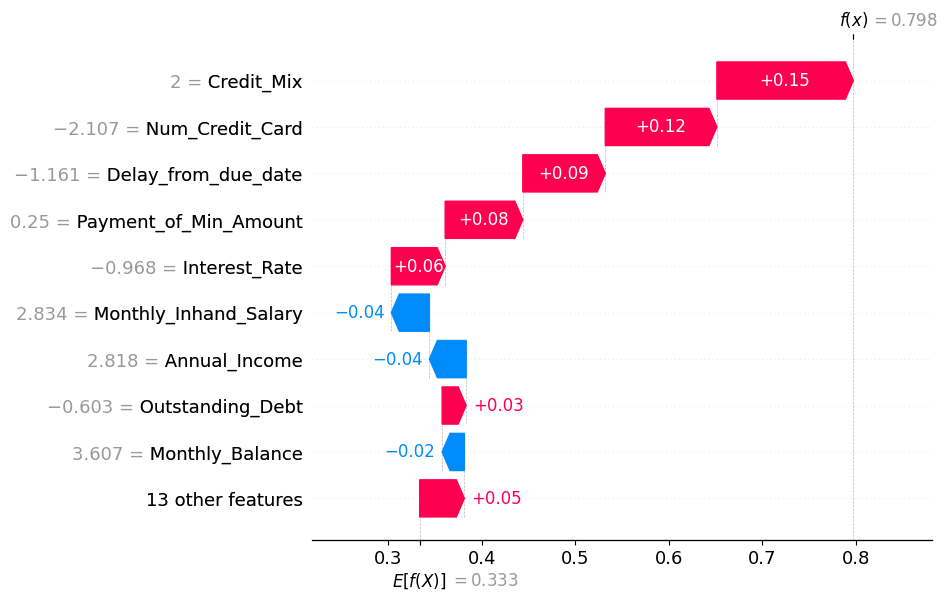

In [20]:
#  Create SHAP Explainer
explainer = shap.Explainer(model,output_names=['Good', 'Poor', 'Standard'],algorithm = 'tree')

#  Compute SHAP Values for Test Data
shap_values = explainer.shap_values(X_test)

row = 7
shap.waterfall_plot(shap.Explanation(values=shap_values[:,:,0][row], base_values=explainer.expected_value[0], 
                                     data=X_test.iloc[row], feature_names= X_test.columns.tolist()))

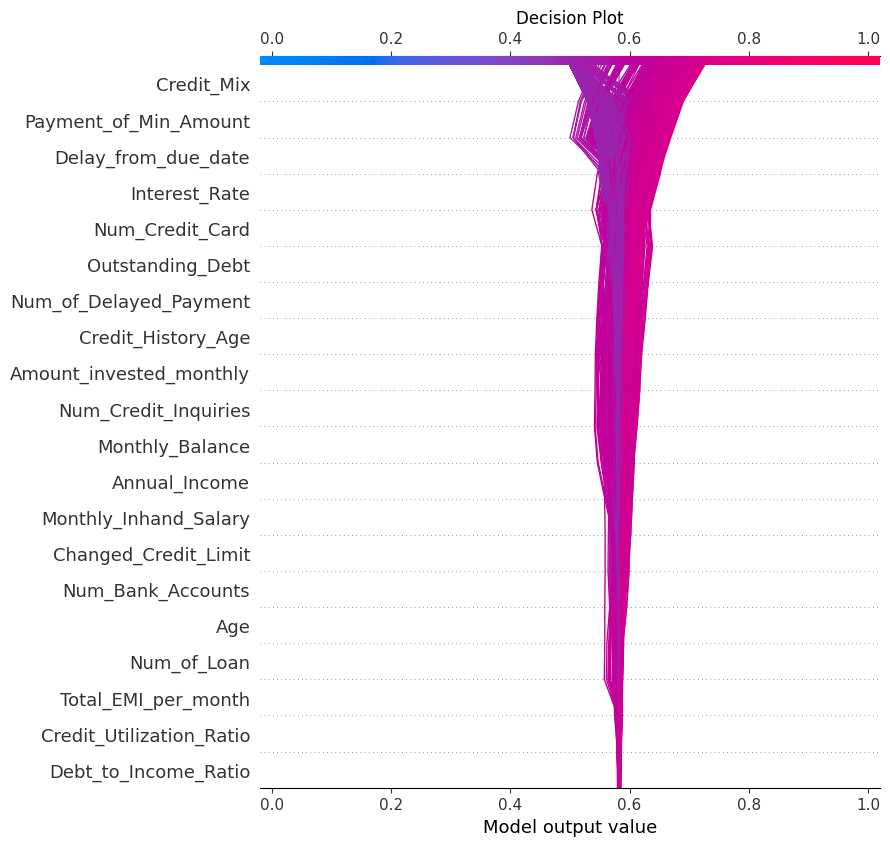

In [21]:
shap.decision_plot(
    explainer.expected_value[0],          
    shap_values[:,:,0],                       
    features=X.loc[7, :],                 
    link='logit',                         
    feature_names=X_test.columns.tolist(),     
    title="Decision Plot",                
    show=True                           
)

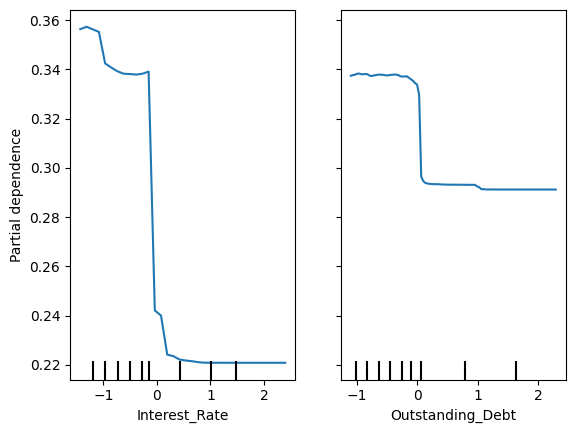

In [21]:
# Plot PDP for 'Interest_Rate' and 'Outstanding_Debt'

features = ['Interest_Rate', 'Outstanding_Debt']
PartialDependenceDisplay.from_estimator(model, X_test, features=features,target='Good')

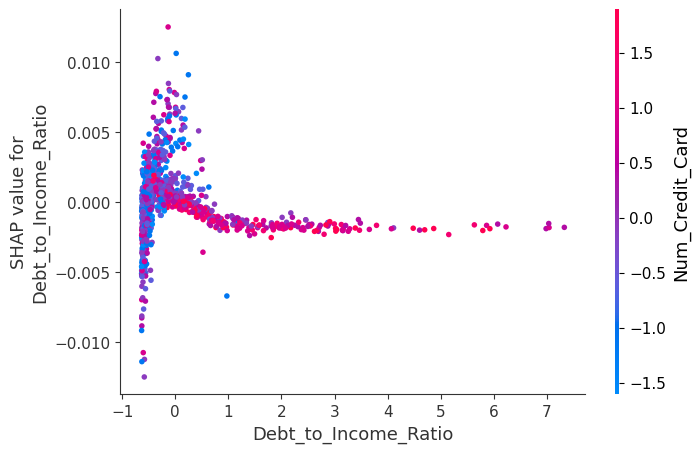

In [37]:
# Dependence Plot of Debt_to_Income_Ratio for Class 'Good'

#  Create SHAP Explainer
explainer = shap.Explainer(model,output_names=['Good', 'Poor', 'Standard'],algorithm = 'tree')

#  Compute SHAP Values for Test Data
shap_values = explainer.shap_values(X_test)

# dependence plot 
shap.dependence_plot("Debt_to_Income_Ratio", shap_values[:,:,0], X_test, interaction_index="Num_Credit_Card")

As the number of credit cards increases, so does the Debt to income ratio. Also, smaller debt to income ratio means more influential shap values.

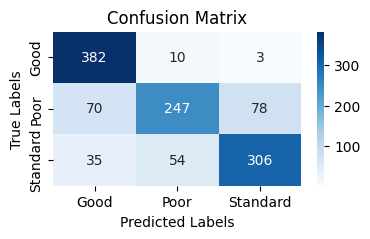

{'Accuracy (%)': '78.90',
 'Precision (Weighted, %)': '78.98',
 'Recall (Weighted, %)': '78.90',
 'F1-Score (Weighted, %)': '78.28',
 "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 105,
 'Type II Error Percentage': '8.86'}

In [68]:
# Logistic Regression 

model = log_reg
fit_predict_evaluate_model(model)

In [69]:
eli5.show_weights(model, feature_names=list(X_test.columns), target_names=class_names)

We observe that the created attribute 'Debt to income ratio' is highly influential on model prediction. It has a strong positive impact on the Good credit score and a negative impact on the other two targets.

<Figure size 1000x600 with 0 Axes>

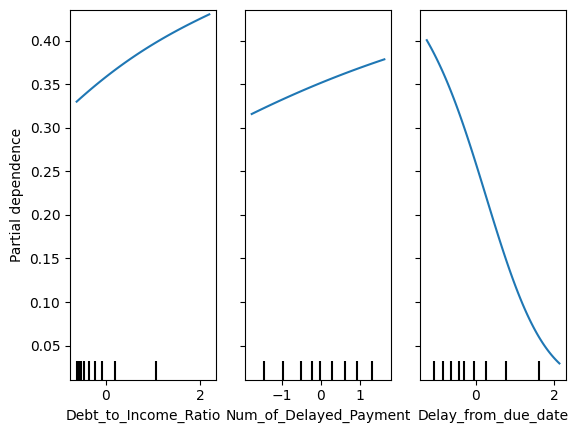

In [80]:
# Plot partial dependence for a specific feature

plt.figure(figsize=(10, 6))
PartialDependenceDisplay.from_estimator(model, X_test, features=['Debt_to_Income_Ratio','Num_of_Delayed_Payment',
                                                                'Delay_from_due_date'],target='Good')
plt.show()

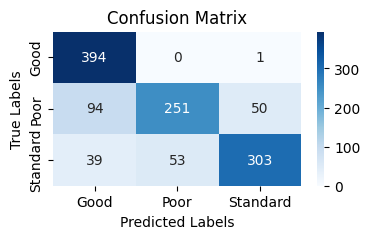

{'Accuracy (%)': '80.00',
 'Precision (Weighted, %)': '80.97',
 'Recall (Weighted, %)': '80.00',
 'F1-Score (Weighted, %)': '79.40',
 "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 133,
 'Type II Error Percentage': '11.22'}

In [72]:
# Support Vector Machine 

model = svm
fit_predict_evaluate_model(model)

In [73]:
y_pred = pd.Series(model.predict(X_test.iloc[0:11]),name='prediction')
y_true = pd.Series(y_test.iloc[0:11].values, name = 'true score')
pd.DataFrame([y_true,y_pred])
# Data to experiment with: 

,0,1,2,3,4,5,6,7,8,9,10
true score,Standard,Poor,Standard,Poor,Standard,Poor,Standard,Good,Standard,Standard,Standard
prediction,Standard,Standard,Standard,Poor,Standard,Poor,Standard,Good,Standard,Good,Poor


Since SVMs are not inherently interpretable (unlike decision trees), XAI methods can help visualize and understand how the SVM makes predictions.

In [88]:
# Initialize SHAP KernelExplainer
explainer = shap.KernelExplainer(model.predict_proba, X_train[:10])  # Sample subset of training data

# Calculate SHAP values
shap_values = explainer.shap_values(X_test[:10], nsamples=100)

  0%|          | 0/10 [00:00<?, ?it/s]

Summary plot for Class: Good


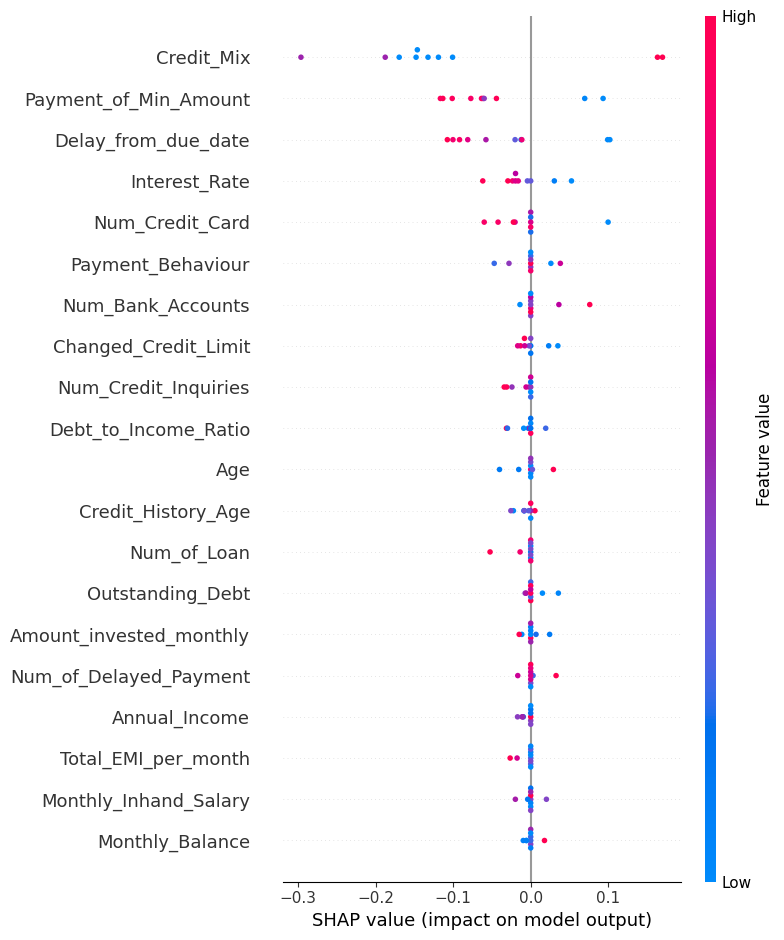

Summary plot for Class: Poor


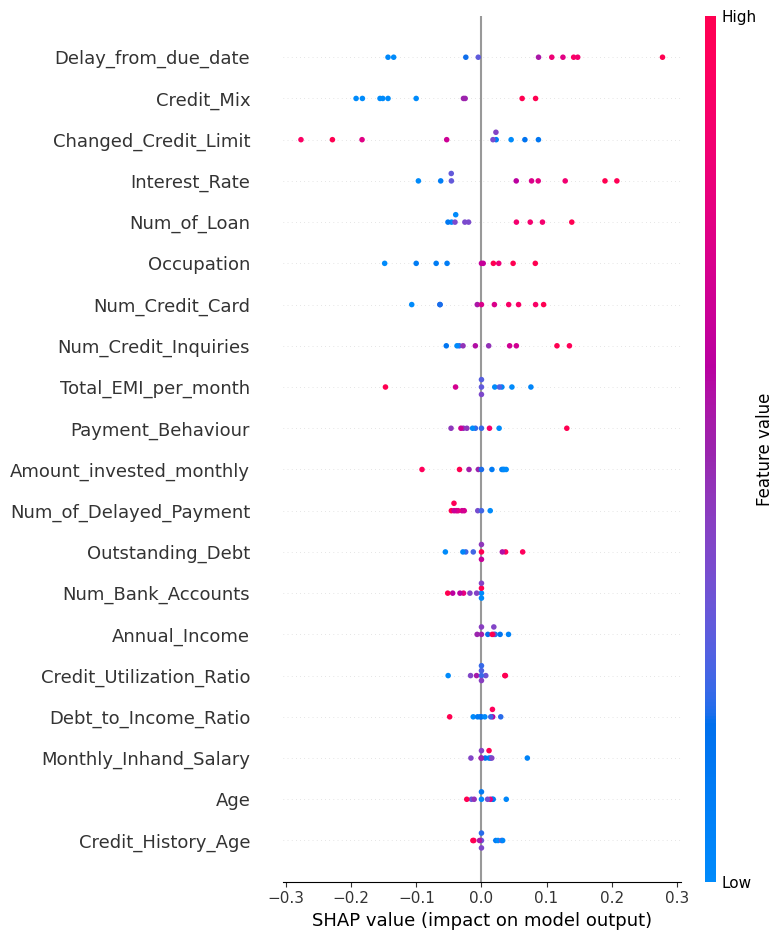

Summary plot for Class: Standard


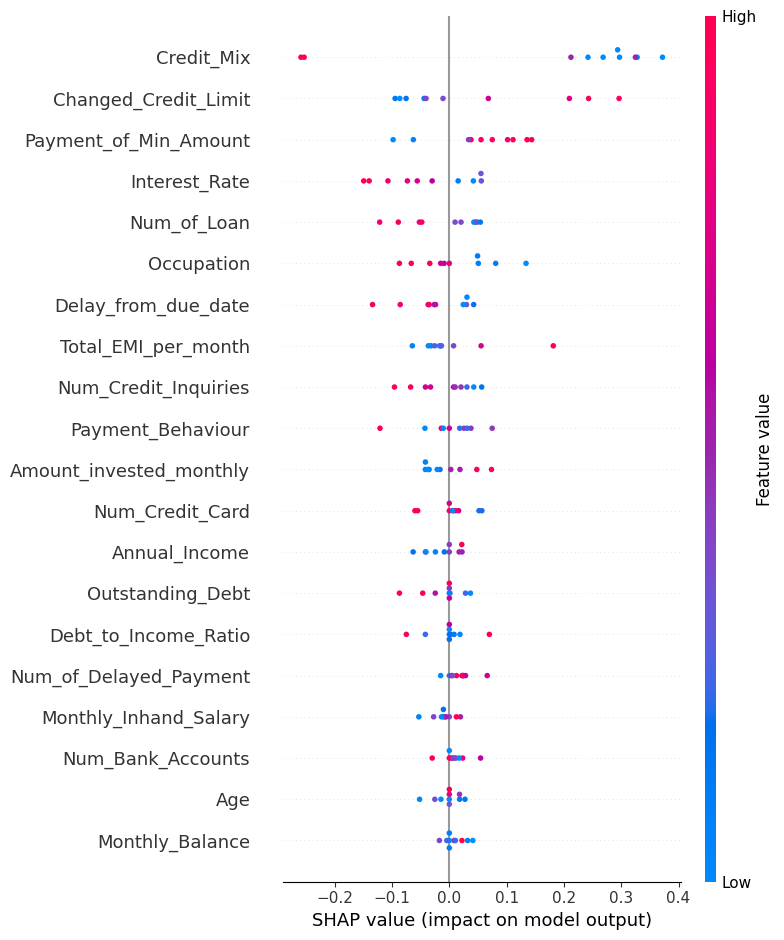

In [89]:
# Plot SHAP summary plot
# Summary plot for Class 0
print( 'Summary plot for Class: Good')
shap.summary_plot(shap_values = shap_values[:,:,0],features = X_test[:10], feature_names=X_test.columns)

# Summary plot for Class 1
print( 'Summary plot for Class: Poor')
shap.summary_plot(shap_values[:,:,1], X_test[:10], feature_names=X_test.columns)

# Summary plot for Class 2
print( 'Summary plot for Class: Standard')
shap.summary_plot(shap_values[:,:,2], X_test[:10], feature_names=X_test.columns)

Class 'Good':
High values of payment of min amount, delay from due date, interest rate and number of credit cards contribute negatively to the model prediction on class Good.
Class 'Poor','Standard':
It is remarkable that occupation has high influence on the model prediction.

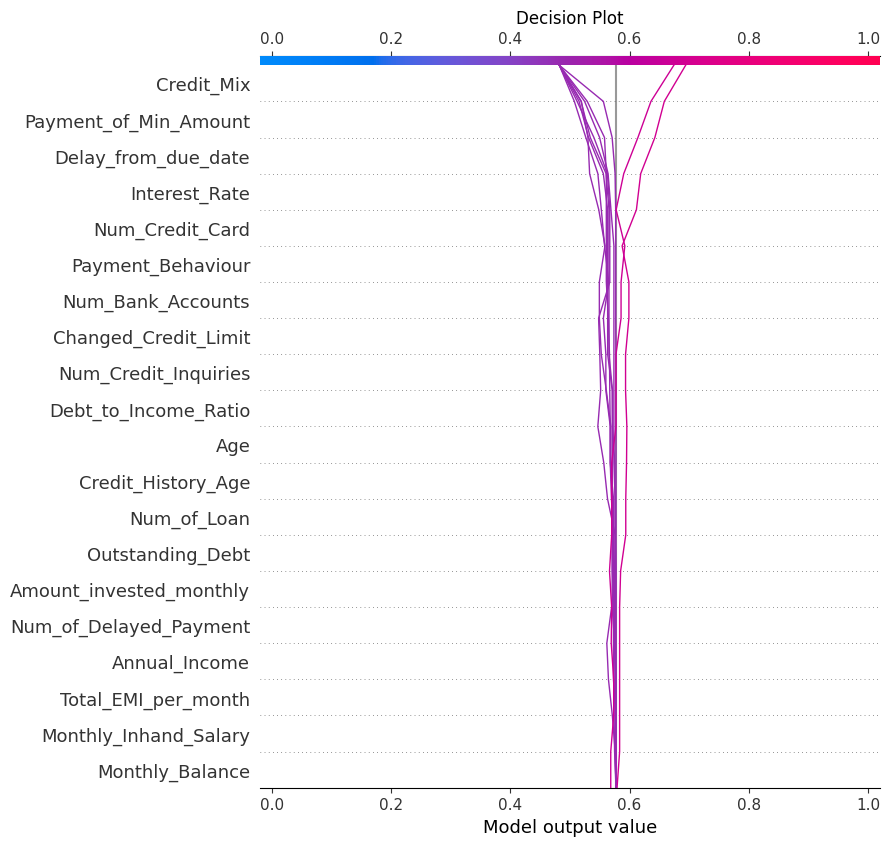

In [97]:
# Generate Decision plot for Customer 0
shap.decision_plot(
    explainer.expected_value[2],          
    shap_values[:,:,0],                       
    features=X.loc[0, :],                 
    link='logit',                         
    feature_names=X_test.columns.tolist(),     
    title="Decision Plot",                
    show=True                           
)


This decision plot visually explains how individual features contribute to a single model prediction (customer 0) by showing how the SHAP values for each feature combine to arrive at the final model output. Like a force plot, a decision plot shows the important features involved in a model’s output. However, a decision plot can be more helpful than a force plot when there are a large number of significant features involved. X-axis represents the model output (in this case, the probability or log-odds) that ranges from 0.0 to 1.0. The features higher up on the plot contribute the most to the prediction. Credit_Mix, Payment_of_Min_Amount, and Delay_from_due_date appear to have significant contributions. The steeper the slope of a line segment, the larger the impact of that feature. For instance, Credit_Mix has a sharp movement to the right, suggesting it positively impacted the prediction. The path cumulatively shows how each feature's contribution builds up to the final model output.

In [101]:
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_test.columns, class_names=['Good', 'Poor', 'Standard'],
                                                   mode='classification')

# Explain a single instance (0)
exp = explainer.explain_instance(X_test.iloc[0].values, model.predict_proba)
exp.show_in_notebook() 

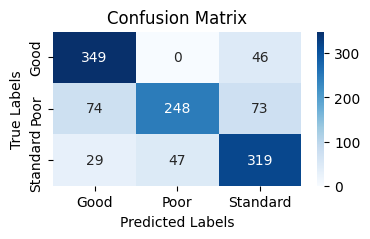

/nModel :  KNeighborsClassifier(n_neighbors=21) 
 {'Accuracy (%)': '77.30', 'Precision (Weighted, %)': '78.04', 'Recall (Weighted, %)': '77.30', 'F1-Score (Weighted, %)': '76.96', "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 103, 'Type II Error Percentage': '8.69'}


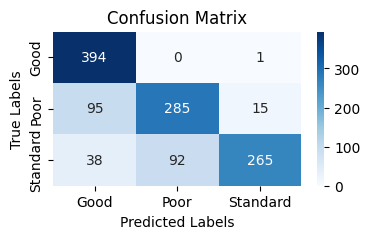

/nModel :  GaussianNB() 
 {'Accuracy (%)': '79.66', 'Precision (Weighted, %)': '81.56', 'Recall (Weighted, %)': '79.66', 'F1-Score (Weighted, %)': '79.23', "Type II Error (Predicted 'Good' but Actually 'Bad/Standard')": 133, 'Type II Error Percentage': '11.22'}


In [108]:
# k-Nearest Neighboors and Naive Bayes models Evaluation 
models = [knn,nb]
for m in models:
    print('/nModel : ',m,'\n',fit_predict_evaluate_model(m))